# <b>ST590 Project 3</b>
## Vivi Feathers & Yan Liu

# <b>Introduction</b>
<b>Purples</b>: Using `MLlib` from `pyspark` to Fit Machine Learning Models, finding the relationship between obesity and people's eating habits & their physical condition.

<b>Dataset</b>:
[Estimation of obesity levels based on eating habits and physical condition Data Set](https://archive.ics.uci.edu/ml/datasets/Estimation+of+obesity+levels+based+on+eating+habits+and+physical+condition+) include data for the estimation of obesity levels in individuals from the countries of Mexico, Peru and Colombia, based on their eating habits and physical condition. The data contains 17 attributes and 2111 records, the records are labeled with the class variable NObesity (Obesity Level based on BMI which is calculated by height and weight), that allows classification of the data using the values of Insufficient Weight, Normal Weight, Overweight Level I, Overweight Level II, Obesity Type I, Obesity Type II and Obesity Type III. 77% of the data was generated synthetically using the Weka tool and the SMOTE filter, 23% of the data was collected directly from users through a web platform.</b> 
<br>
<br>The predictors in this dataset are: Frequent consumption of high caloric food (FAVC), Frequency of consumption of vegetables (FCVC), Number of main meals (NCP), Consumption of food between meals (CAEC), Consumption of water daily (CH20), Consumption of alcohol (CALC), Calories consumption monitoring (SCC), Physical activity frequency (FAF), Time using technology devices (TUE), Transportation used (MTRANS), Gender, Age, Height and Weight. <br>
<br>
<b>Data cleaning and modification</b>: No missing data were detected in the dataset, however,
To have a binary response in the latter modeling, we classified Obesity Type I, Obesity Type II and Obesity Type III as obesityYes (obsYes=1), the rest levels of NObesity as obesityYes (obsYes=0).

<b>Supervised Learning Idea and Data Split</b>:
Supervised learning means that a variable or variables in the data set represent an output or response variable
Generally speaking, supervised Learning try to relate predictors to a response variable through a model, including making inference on the model parameters, predicting a value or classifying an observation. The process is applying supervised learning algorithms to take a known set of input data (the learning set) and known responses to the data (the output), and forms models to generate reasonable predictions for the response to the new input data.<br>
<br>
To identify the most ideal model for prediction, we split our data into a <b>training and test set</b>. The process of tuning the hyperparameter(s) and estimating the model parameters are only done iteratively in the training data. The test set is used to produce unbiased estimate of the performance for the final model chosen. The testing data can not be untouched or unseen during the training process. We must split our data into a training and test set before the model fitting. Otherwise it may result in overfitting since we have already used the test set to build the final model.


<style>
        .tab1 {
            tab-size: 2;
        }
    </style>
<b>Models:</b> We fit the data set with three different classes of models: Logistic model, Classification tree and Random Forest model. Here we are going to brief discuss the general idea of those models and how they work. <br>
Logistic model: Logistic regression models are used mostly as a tool for data analysis and inference, where the main goal is to understand the role of the predictors in explaining the outcome. Logistic regression does not make many of the key assumptions of linear regression and general linear models that are based on ordinary least squares algorithms – particularly regarding linearity, normality, homoscedasticity, and measurement level. Our data meets all the assumptions for logistic regression. First, the response is binary. Second, the observations are different patients which are independent of each other. Third, there is no multicollinearity among the predictors as we shown in the latter correlation matrix. <br>

Classification Tree model: The basic idea of tree models is to split up predictor space into regions. Each region represents different predictions. Classification tree is to classify or predict group memberships. For a given region, usually use most prevalent class as prediction. One main advantage of trees is that they can be displayed graphically, and are easily interpreted even by a non-expert - this is especially true for small trees. The reason is that trees are very easy to explain to people since they more closely mirror human decision-making. Also, trees can easily handle categorical predictors without the need to create dummy variables. Since our response is binary, we applied a Classification Tree to fit our data. 

Random Forest model: Random Forest is based on the bagging algorithm and uses Ensemble Learning technique. Random forests provide an improvement over bagging by decorrelating the trees. It forces each split to consider only a subset of the predictors. As in bagging, we build a number of decision trees on bootstrapped training samples. When building these decision trees, for each split in a tree,  a random subset of predictors is chosen as split candidates from the full set of p predictors. Generally, Random Forest will provide a better prediction performance than Classification Tree. However, a disadvantage of random forest is that the resulting model is often difficult or impossible to interpret, as we are averaging many trees rather than looking at a single tree.  

<b>Modules:</b>
<pre class="tab1">1. pandas</pre>
<pre class="tab1">2. pyspark</pre>
<pre class="tab1">3. matplotlib.pyplot</pre>
<pre class="tab1">4. pyspark.sql</pre>
<pre class="tab1">5. os</pre>
<pre class="tab1">6. sys</pre>
<pre class="tab1">7. pyspark.ml</pre>



## Read in dataset and display the first several rows

In [1]:
### Import modules
import pandas as pd
import matplotlib.pyplot as plt
import pyspark.pandas as ps
import os
import sys
os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()
from pyspark.ml import Pipeline
from pyspark.ml.feature import SQLTransformer, VectorAssembler, StringIndexer, VectorIndexer, IndexToString, Interaction, StandardScaler, PCA
from pyspark.ml.classification import LogisticRegression, DecisionTreeClassifier, RandomForestClassifier
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

In [2]:
### Read in the data
obdt = pd.read_csv("ObesityDataSet_cleaned.csv")
obdt.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObesity
0,Female,21.0,1.62,64.0,yes,no,2,3,Sometimes,no,2,no,0,1,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3,3,Sometimes,yes,3,yes,3,0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2,3,Sometimes,no,2,no,2,1,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3,3,Sometimes,no,2,no,2,0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2,1,Sometimes,no,2,no,0,0,Sometimes,Public_Transportation,Overweight_Level_II


In [3]:
### Investigate the shape
obdt.shape

(2111, 17)

### Convert the pandas data frame to Spark SQL data

In [4]:
originalSQL = spark.createDataFrame(obdt)
originalSQL.show(5)

+------+----+------+------+------------------------------+----+----+---+---------+-----+----+---+---+---+----------+--------------------+-------------------+
|Gender| Age|Height|Weight|family_history_with_overweight|FAVC|FCVC|NCP|     CAEC|SMOKE|CH2O|SCC|FAF|TUE|      CALC|              MTRANS|           NObesity|
+------+----+------+------+------------------------------+----+----+---+---------+-----+----+---+---+---+----------+--------------------+-------------------+
|Female|21.0|  1.62|  64.0|                           yes|  no|   2|  3|Sometimes|   no|   2| no|  0|  1|        no|Public_Transporta...|      Normal_Weight|
|Female|21.0|  1.52|  56.0|                           yes|  no|   3|  3|Sometimes|  yes|   3|yes|  3|  0| Sometimes|Public_Transporta...|      Normal_Weight|
|  Male|23.0|   1.8|  77.0|                           yes|  no|   2|  3|Sometimes|   no|   2| no|  2|  1|Frequently|Public_Transporta...|      Normal_Weight|
|  Male|27.0|   1.8|  87.0|                         

## Training/Test Split

In [5]:
### split the Original dataset to be training part and test part
train, test = originalSQL.randomSplit([0.8,0.2], seed=1)
print(train.count(), test.count())
train.head()

1687 424


Row(Gender='Female', Age=15.0, Height=1.65, Weight=86.0, family_history_with_overweight='yes', FAVC='yes', FCVC=3, NCP=3, CAEC='Sometimes', SMOKE='no', CH2O=1, SCC='no', FAF=3, TUE=2, CALC='no', MTRANS='Walking', NObesity='Obesity_Type_I')

In [6]:
test.head()

Row(Gender='Female', Age=17.0, Height=1.75, Weight=57.0, family_history_with_overweight='yes', FAVC='yes', FCVC=3, NCP=3, CAEC='Frequently', SMOKE='no', CH2O=2, SCC='no', FAF=0, TUE=1, CALC='no', MTRANS='Public_Transportation', NObesity='Normal_Weight')

# <b>EDA</b>
EDA is done using the Training dataset

In [7]:
### convert training dataset to pandas-on-spark
obesitydata = train.to_pandas_on_spark()

## `NObesity` one way contingency table

In [8]:
table = obesitydata.NObesity.value_counts(dropna = False)
print(table)

Obesity_Type_I         282
Obesity_Type_III       263
Obesity_Type_II        240
Overweight_Level_II    239
Normal_Weight          235
Overweight_Level_I     221
Insufficient_Weight    207
Name: NObesity, dtype: int64


<font color='red'>Obesity_Type_I has the highest frequency (16.63%) and Insufficient_weight has the least subjects (12.88%).

## Bar Charts and Two-way Contingency Tables of categorical predictors

In [9]:
def bar_chart (var):
    ''' Use SQL format of training dataset to create a contingency table of the selected variable vs `NOBesity`
    subset the dataframe by the selected variable and create a bar chart '''
    table1 = train.crosstab(var,"NObesity").show()
    obesitydata[var].plot.bar().show()
    return table1

### Bar Chart and Two-way Contingency Table of `Gender` vs `NObesity`

+---------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|Gender_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+---------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|           Male|                 70|          117|           157|            238|               0|               110|                154|
|         Female|                137|          118|           125|              2|             263|               111|                 85|
+---------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+



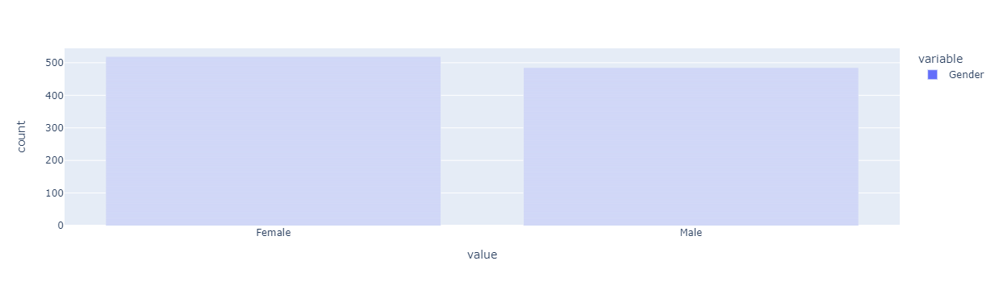

In [10]:
bar_chart ("Gender")

<font color='red'>In female group, the biggest category is Obesity_Type_III and Obesity_Type_II has the least subjects; while in male group, the Obesity_Type_II has the most subjects and Obesity_Type_III is the smallest.

### Bar Chart and Two-way Contingency Table of `family_history_with_overweight` vs `NObesity`

+---------------------------------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|family_history_with_overweight_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+---------------------------------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|                                     no|                111|          112|             6|              1|               0|                59|                 18|
|                                    yes|                 96|          123|           276|            239|             263|               162|                221|
+---------------------------------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+



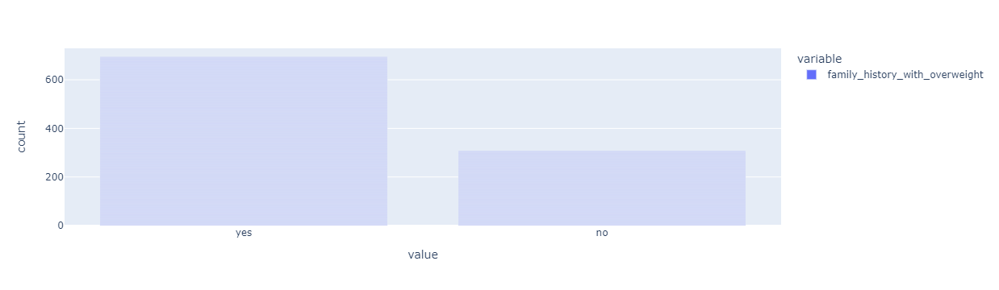

In [11]:
bar_chart ("family_history_with_overweight")

<font color='red'>Subjects that have obesity family history are more likely to develop obesity or become overweight; most of insufficient weight subjects do not have family history of obesity.

### Bar Chart and Two-way Contingency Table of `FAVC` vs `NObesity`

+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|FAVC_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|           no|                 42|           69|            11|              5|               1|                17|                 62|
|          yes|                165|          166|           271|            235|             262|               204|                177|
+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+



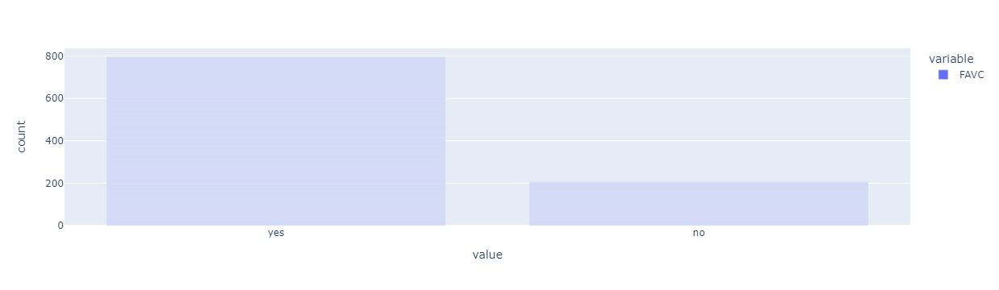

In [12]:
bar_chart ("FAVC")

<font color='red'>Most of the subjects consume high caloric food frequently regardless of their weight levels.

### Bar Chart and Two-way Contingency Table of `CAEC` vs `NObesity`

+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|CAEC_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|   Frequently|                 98|           72|             6|              1|               0|                10|                 14|
|       Always|                  2|           29|             3|              1|               0|                 4|                  2|
|           no|                  3|            9|             1|              1|               0|                27|                  1|
|    Sometimes|                104|          125|           272|            237|             263|               180|                222|
+-------------+-------------------+------

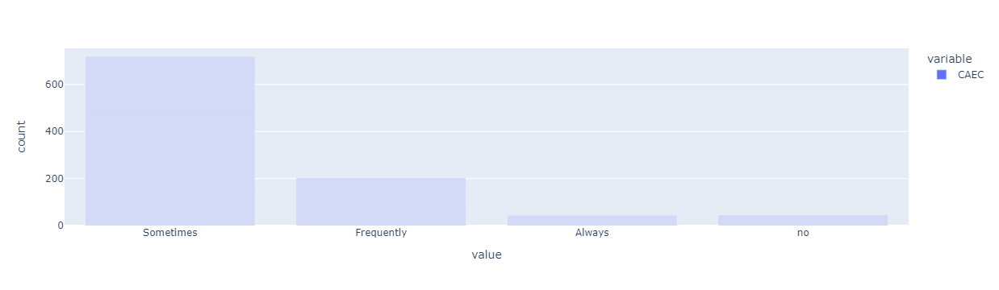

In [13]:
bar_chart ("CAEC")

<font color='red'>Most subjects sometimes consume food in between of meals in every weight group; interestingly, Normal and insufficient weight groups tend to consume food in between of meals more frequently than overweight and obesity groups.

### Bar Chart and Two-way Contingency Table of `SMOKE` vs `NObesity`

+--------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|SMOKE_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+--------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|            no|                207|          225|           277|            230|             262|               218|                235|
|           yes|                  0|           10|             5|             10|               1|                 3|                  4|
+--------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+



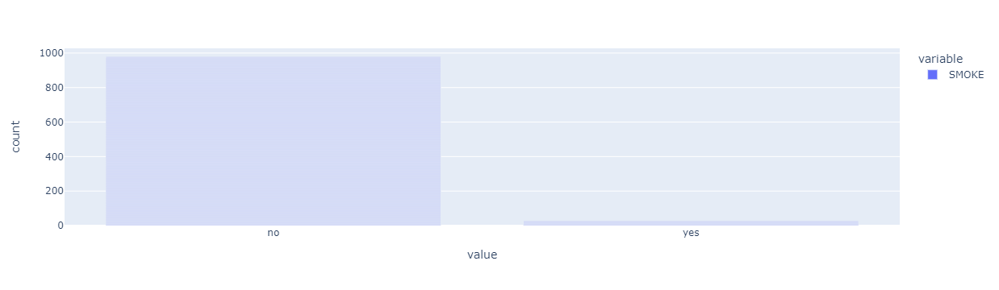

In [14]:
bar_chart ("SMOKE")

<font color='red'>There are a few subjects smoke in each weight group.

### Bar Chart and Two-way Contingency Table of `SCC` vs `NObesity`

+------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|SCC_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|          no|                190|          212|           280|            239|             263|               193|                235|
|         yes|                 17|           23|             2|              1|               0|                28|                  4|
+------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+



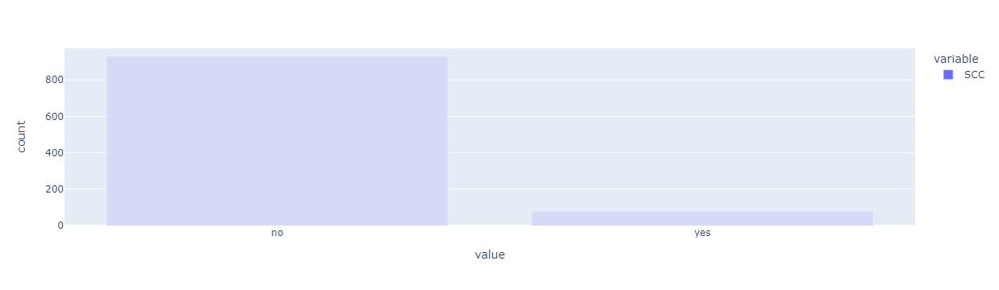

In [15]:
bar_chart ("SCC")

<font color='red'>There are a few subjects monitor their calorie intake in each weight group.

### Bar Chart and Two-way Contingency Table of `CALC` vs `NObesity`

+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|CALC_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|   Frequently|                  1|           17|            12|              2|               0|                11|                 15|
|           no|                 91|           86|           131|             55|               1|                38|                108|
|    Sometimes|                115|          132|           139|            183|             262|               172|                116|
+-------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+



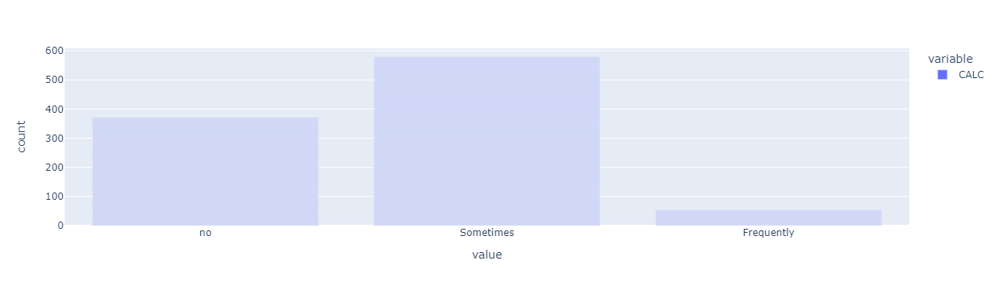

In [16]:
bar_chart ("CALC")

<font color='red'>Most subjects drink alcohol occasionally in each weight group.

### Bar Chart and Two-way Contingency Table of `MTRANS` vs `NObesity`

+--------------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|     MTRANS_NObesity|Insufficient_Weight|Normal_Weight|Obesity_Type_I|Obesity_Type_II|Obesity_Type_III|Overweight_Level_I|Overweight_Level_II|
+--------------------+-------------------+-------------+--------------+---------------+----------------+------------------+-------------------+
|                Bike|                  0|            3|             0|              0|               0|                 1|                  0|
|          Automobile|                 30|           36|            89|             77|               1|                51|                 73|
|             Walking|                  5|           24|             2|              1|               0|                 8|                  4|
|Public_Transporta...|                172|          169|           188|            162|             262|               160|             

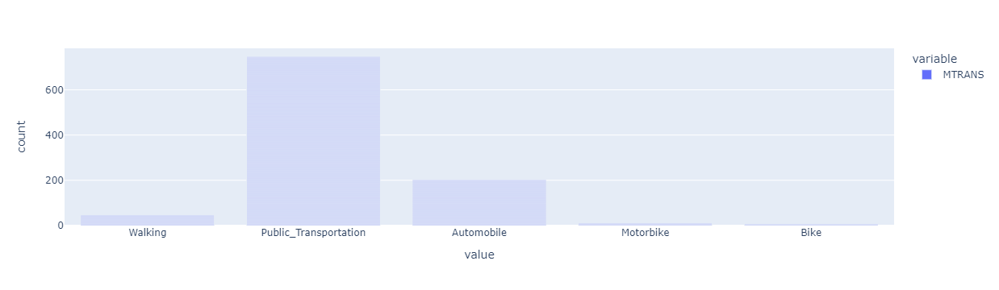

In [17]:
bar_chart ("MTRANS")

<font color='red'>Most subjects use public transportation or automobile in each weight group.

## Description tables and kernel density plots for Numerical predictors in different Obesity groups
### Subset the Training SQL dataset according to different obesity categories in order to create multiple Kernel density plots

In [18]:
obtp1 = train.filter("NObesity == 'Obesity_Type_I'").to_pandas_on_spark()
obtp2 = train.filter("NObesity == 'Obesity_Type_II'").to_pandas_on_spark()
obtp3 = train.filter("NObesity == 'Obesity_Type_III'").to_pandas_on_spark()
ow1 = train.filter("NObesity == 'Overweight_Level_I'").to_pandas_on_spark()
ow2 = train.filter("NObesity == 'Overweight_Level_II'").to_pandas_on_spark()
nw = train.filter("NObesity == 'Normal_Weight'").to_pandas_on_spark()
iw = train.filter("NObesity == 'Insufficient_Weight'").to_pandas_on_spark()

### Kernal plot generation function

In [19]:
def kernel_plot (var1):
    ''' Porduce selected variable's description table and kernel density plot'''
    sub_g = obesitydata.loc[:,[var1,"NObesity"]]
    sv_des = sub_g.groupby("NObesity").describe()
    obtp1[var1].plot.density(bw_method = 0.5).show()
    obtp2[var1].plot.density(bw_method = 0.5).show()
    obtp3[var1].plot.density(bw_method = 0.5).show()
    ow1[var1].plot.density(bw_method = 0.5).show()
    ow2[var1].plot.density(bw_method = 0.5).show()
    nw[var1].plot.density(bw_method = 0.5).show()
    iw[var1].plot.density(bw_method = 0.5).show()
    return sv_des

### Description table and kernel density plot of `Age`

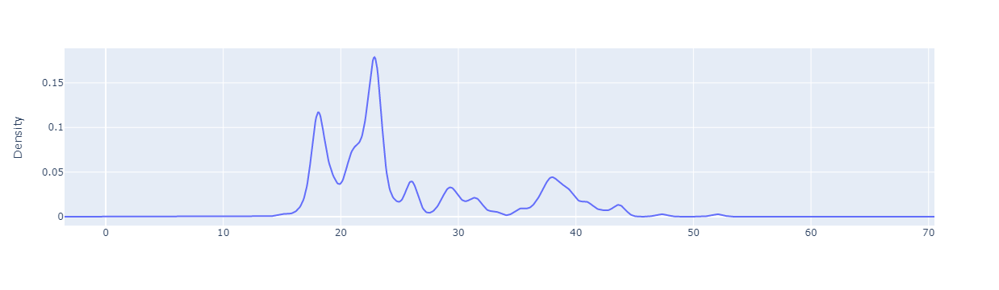

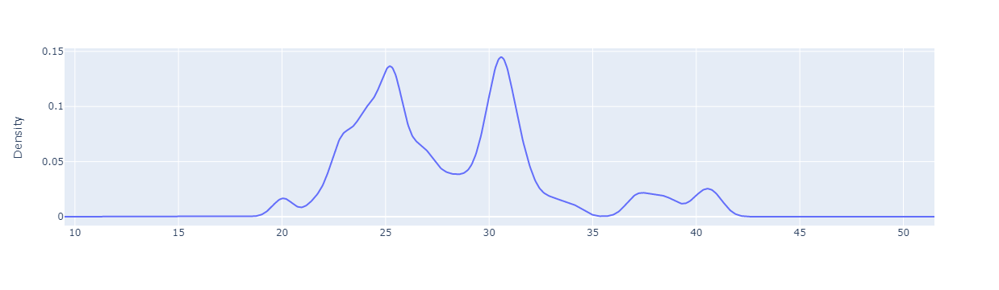

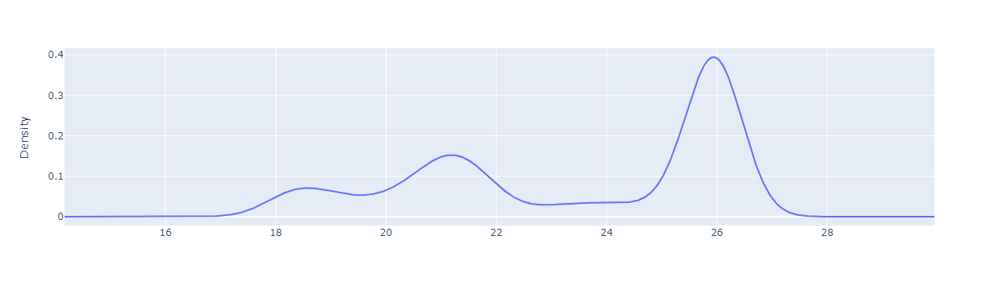

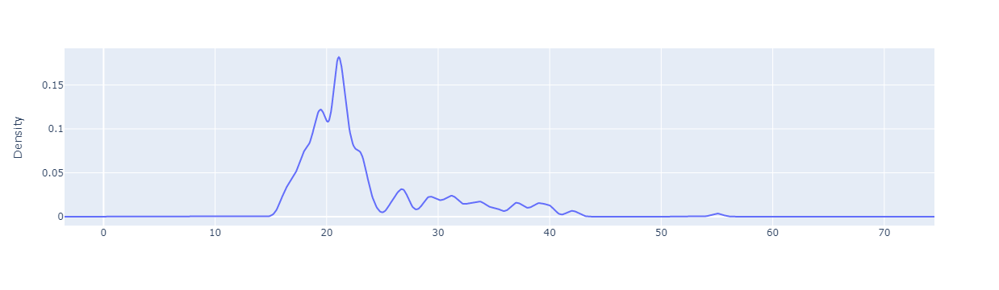

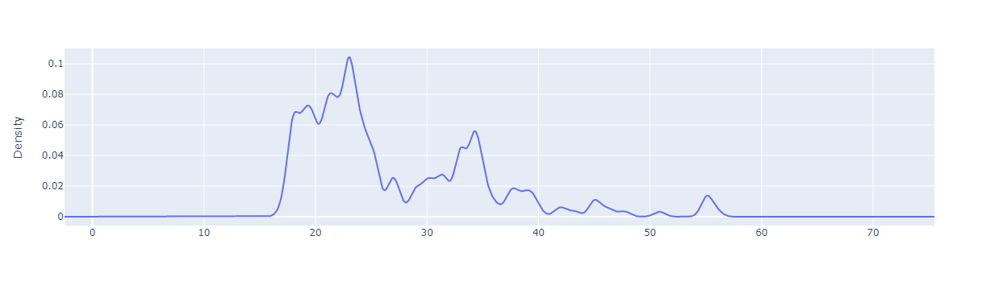

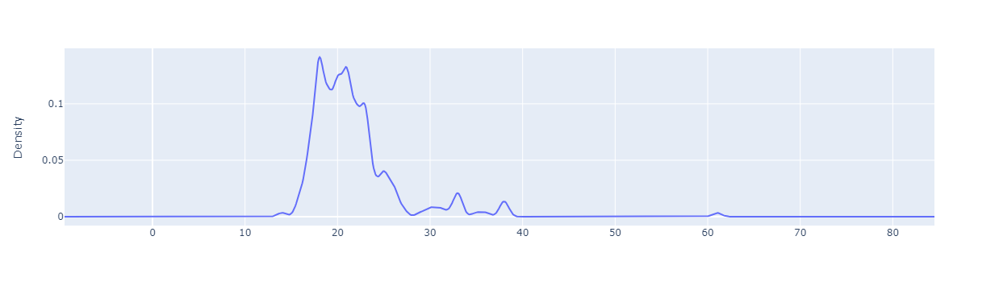

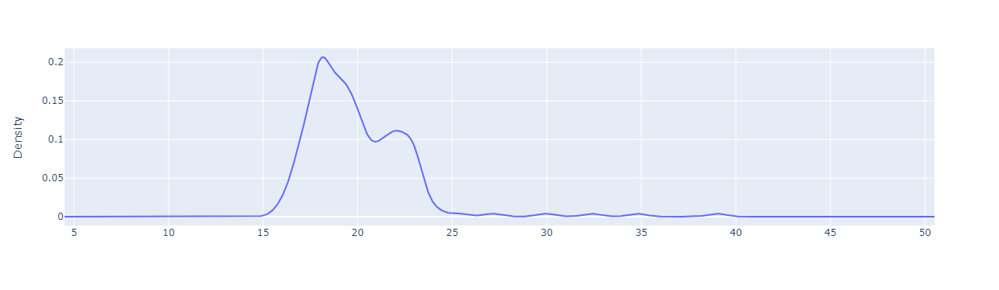

Age                                                                       
                     count       mean       std        min        25%        50%        75%   max
NObesity                                                                                         
Obesity_Type_III     263.0  23.482599  2.782070  18.112503  21.016849  25.470652  26.000000  26.0
Overweight_Level_I   221.0  23.547466  6.376175  16.000000  19.621545  21.028500  26.000000  55.0
Obesity_Type_II      240.0  28.250152  4.757921  20.000000  24.825398  27.186873  30.684347  41.0
Insufficient_Weight  207.0  19.994768  2.876419  16.000000  18.000000  19.349258  21.491055  39.0
Overweight_Level_II  239.0  27.038839  8.301512  17.000000  21.000000  23.940030  33.000000  56.0
Normal_Weight        235.0  21.710638  5.033360  14.000000  19.000000  21.000000  23.000000  61.0
Obesity_Type_I       282.0  25.780438  7.674820  15.000000  20.654752  22.997168  29.633715  52.0

In [20]:
kernel_plot ("Age")

<font color='red'>Obesity_Type_II group has the largest age mean while Insufficient_Weight group has the smallest age mean; Overweight_level_II group has the widest standard deviation and insufficient_weight group has the narrowest standard deviation.

### Description table and kernel density plot of `Height`

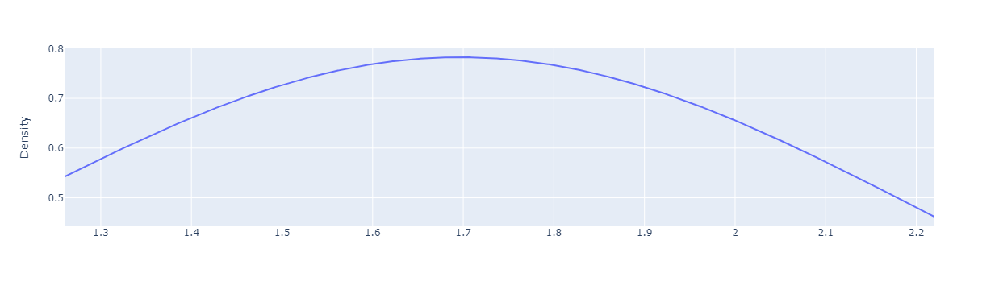

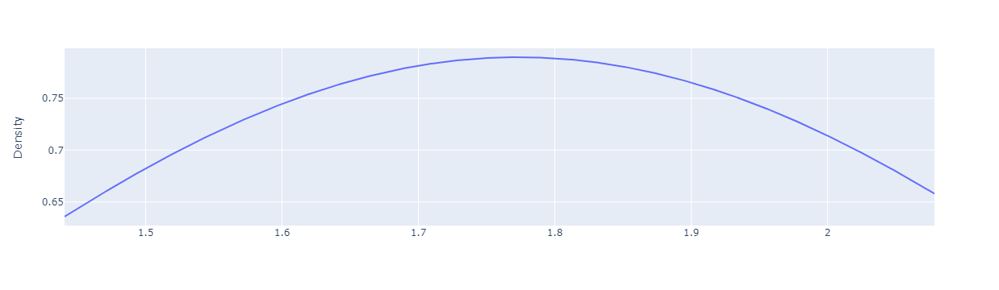

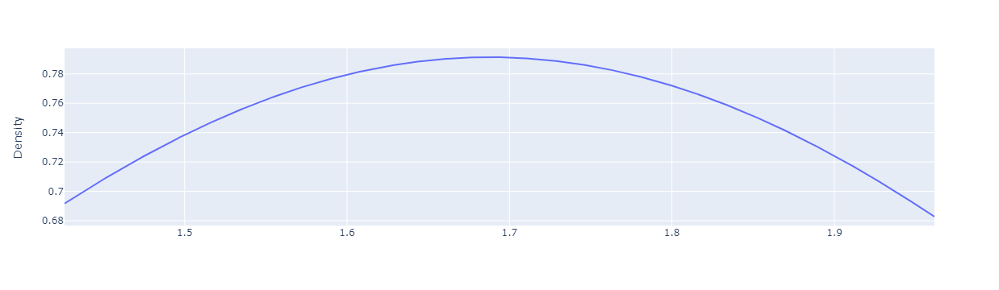

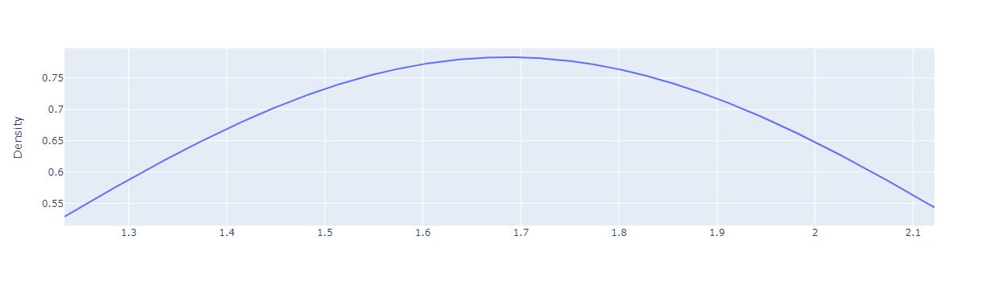

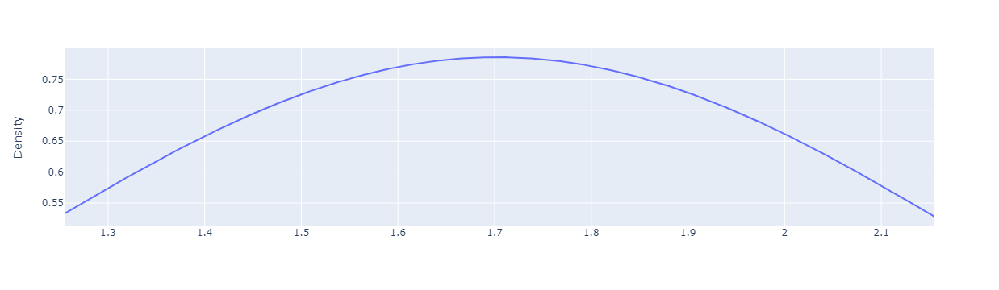

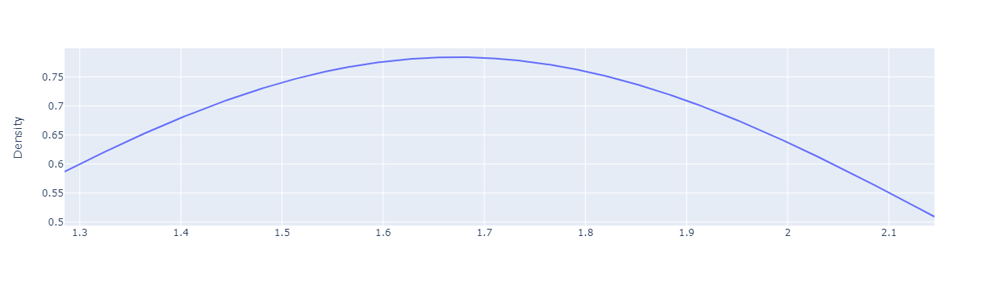

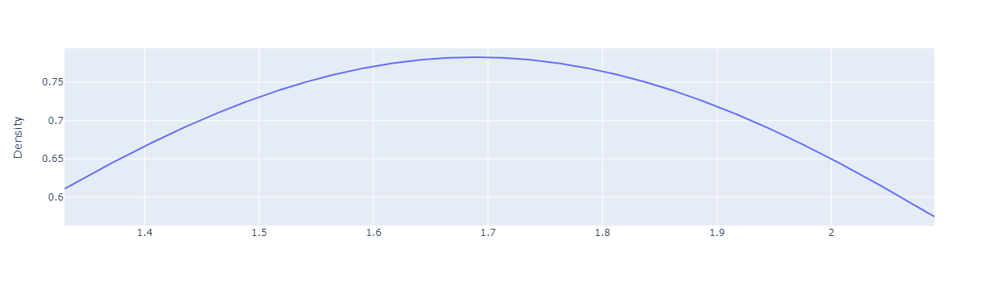

Height                                                                      
                     count      mean       std       min       25%       50%       75%       max
NObesity                                                                                        
Obesity_Type_III     263.0  1.687855  0.064231  1.560000  1.631856  1.668931  1.746061  1.827730
Overweight_Level_I   221.0  1.686334  0.096284  1.456346  1.616533  1.679725  1.756774  1.900000
Obesity_Type_II      240.0  1.772933  0.072917  1.600000  1.750000  1.770278  1.824901  1.918859
Insufficient_Weight  207.0  1.688874  0.098149  1.520000  1.600000  1.700000  1.756330  1.900000
Overweight_Level_II  239.0  1.701861  0.089025  1.480000  1.663178  1.700740  1.750097  1.930000
Normal_Weight        235.0  1.672809  0.094975  1.500000  1.600000  1.660000  1.740000  1.930000
Obesity_Type_I       282.0  1.696785  0.098917  1.500000  1.620930  1.683000  1.781251  1.980000

In [21]:
kernel_plot ("Height")

<font color='red'>Obesity_Type_II group has the largest height mean while Normal_Weight group has the smallest height mean; Obesity_level_I group has the widest standard deviation and Obesity_level_III group has the narrowest standard deviation.

### Description table and kernel density plot of `Weight`

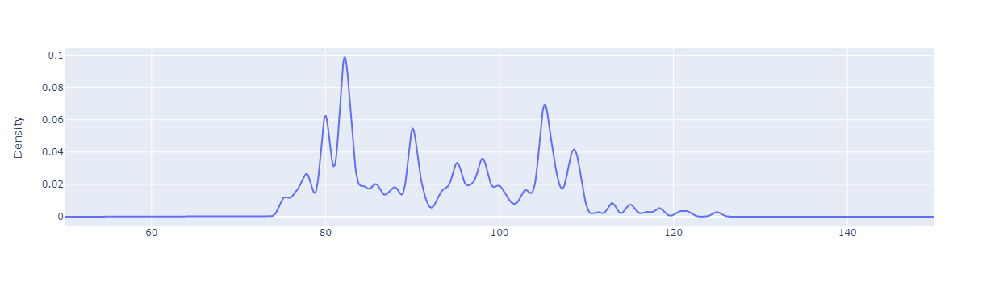

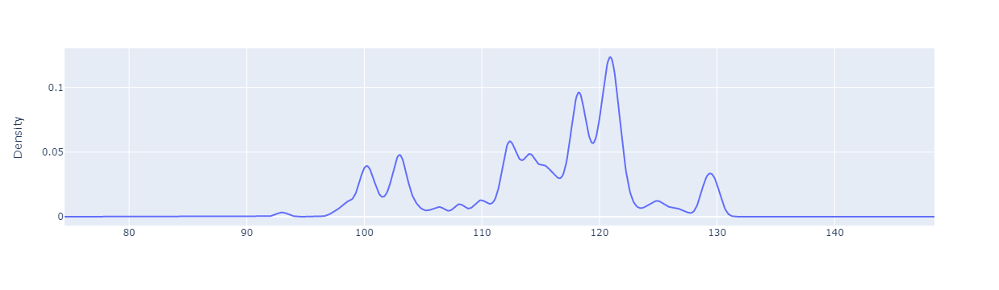

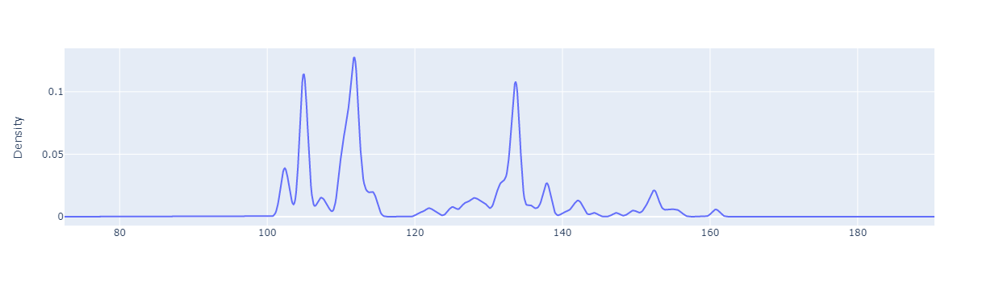

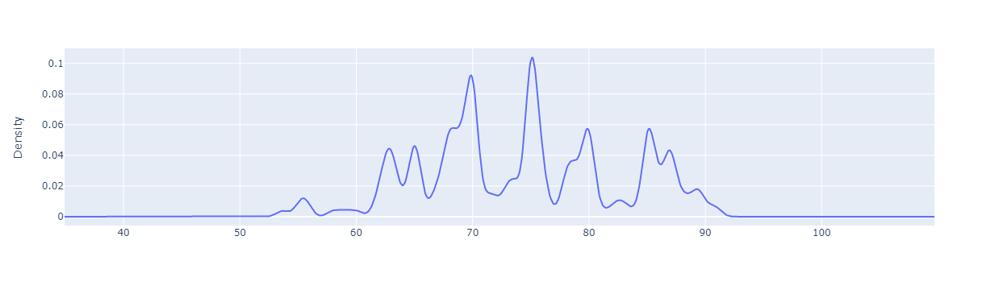

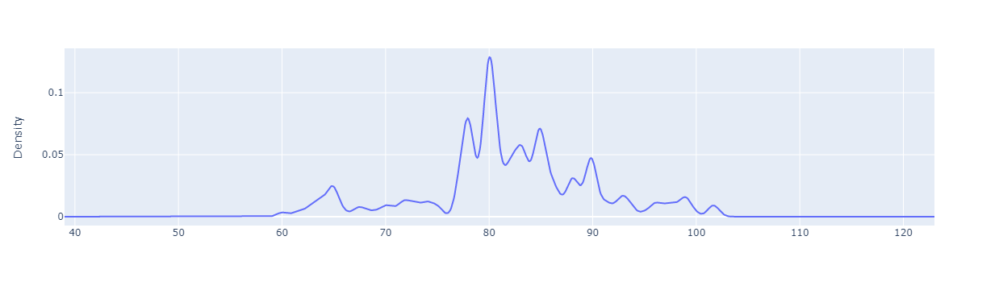

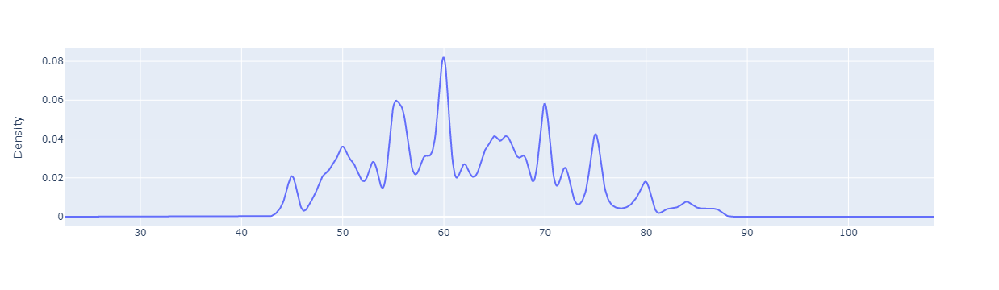

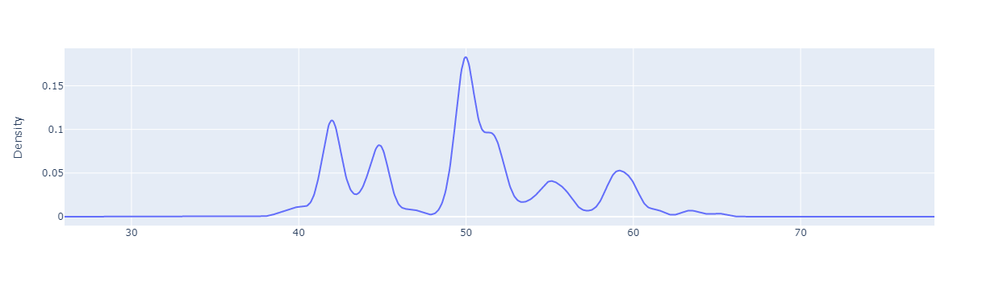

Weight                                                                                   
                     count        mean        std         min         25%         50%         75%         max
NObesity                                                                                                     
Obesity_Type_III     263.0  120.884813  15.191570  102.000000  109.959714  112.098616  133.644711  160.935351
Overweight_Level_I   221.0   74.123851   8.434043   53.620604   68.066090   74.959747   80.000000   91.000000
Obesity_Type_II      240.0  115.324530   8.046202   93.000000  112.007101  117.757010  120.794535  129.991623
Insufficient_Weight  207.0   49.828436   5.814822   39.000000   44.810751   50.000000   52.514302   65.000000
Overweight_Level_II  239.0   81.872115   8.255836   60.000000   78.008388   81.322970   86.080500  102.000000
Normal_Weight        235.0   62.205532   9.482981   44.000000   55.000000   61.000000   69.500000   87.000000
Obesity_Type_I       282.0   93.118069  11.522536   75.000000   82.193405   90.924208  104.970030  125.000000

In [22]:
kernel_plot ("Weight")

<font color='red'>As expected, Obesity_Type_III group has the largest weight mean and the widest standard deviation while Insufficient_Weight group has the smallest weight mean and the narrowest standard deviation.

### Description table and kernel density plot of `CH2O`

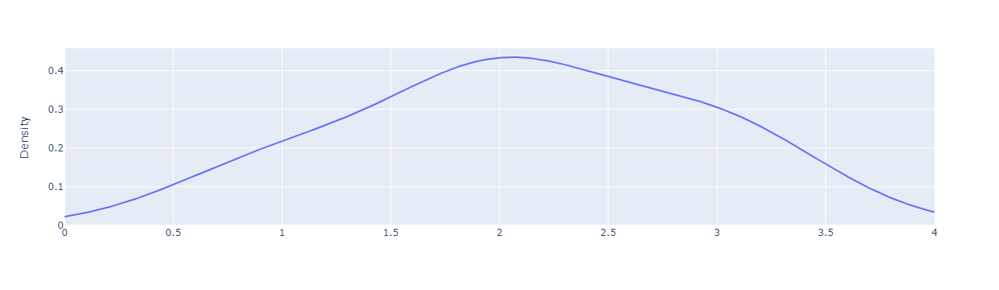

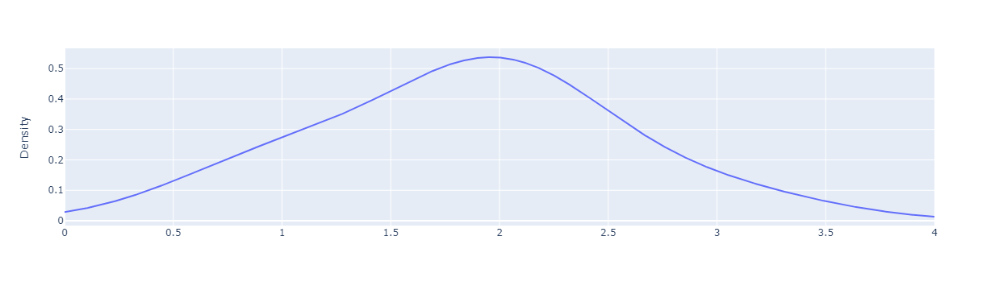

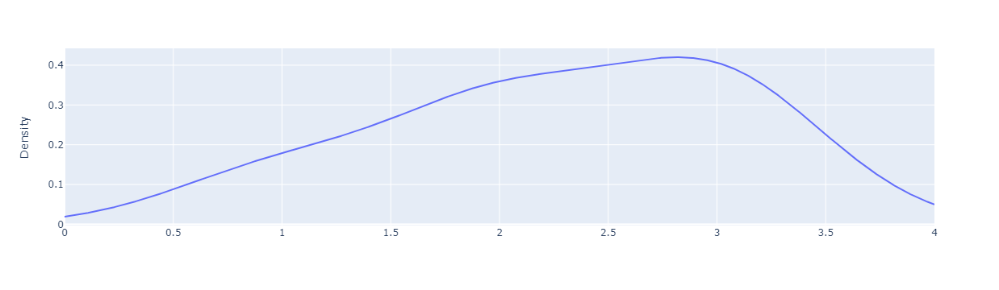

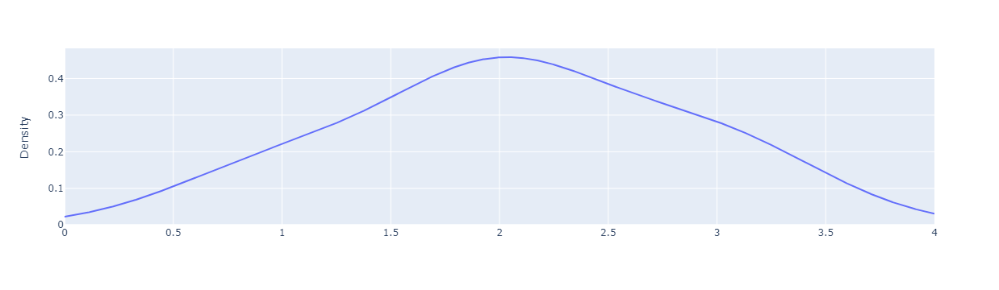

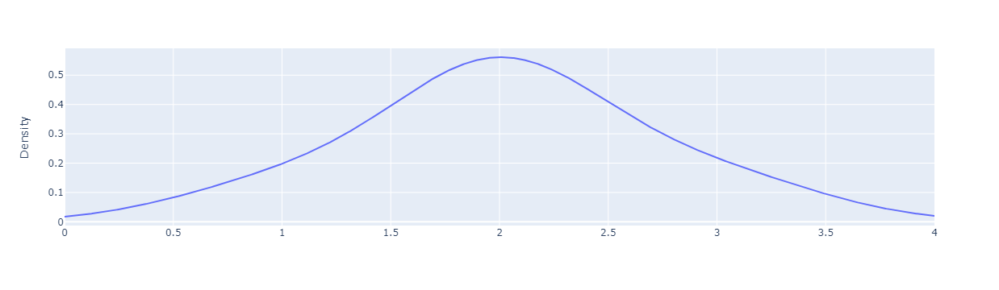

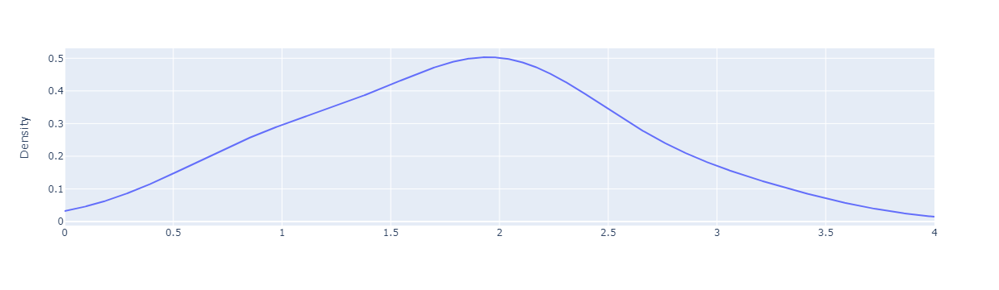

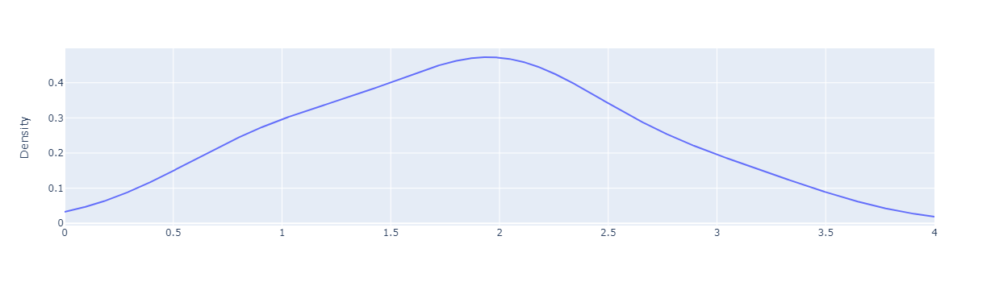

CH2O                                             
                     count      mean       std  min  25%  50%  75%  max
NObesity                                                               
Obesity_Type_III     263.0  2.285171  0.745501  1.0  2.0  2.0  3.0  3.0
Overweight_Level_I   221.0  2.076923  0.699650  1.0  2.0  2.0  3.0  3.0
Obesity_Type_II      240.0  1.862500  0.601471  1.0  1.0  2.0  2.0  3.0
Insufficient_Weight  207.0  1.874396  0.678141  1.0  1.0  2.0  2.0  3.0
Overweight_Level_II  239.0  2.025105  0.586434  1.0  2.0  2.0  2.0  3.0
Normal_Weight        235.0  1.842553  0.637753  1.0  1.0  2.0  2.0  3.0
Obesity_Type_I       282.0  2.109929  0.719807  1.0  2.0  2.0  3.0  3.0

In [23]:
kernel_plot ("CH2O")

<font color='red'>Obesity_Type_III group has the largest mean of daily water consumption and the widest standard deviation; Normal weight group has the smallest mean and overweight_level_II group has the narrowest standard deviation.

### Description table and kernel density plot of `FAF`

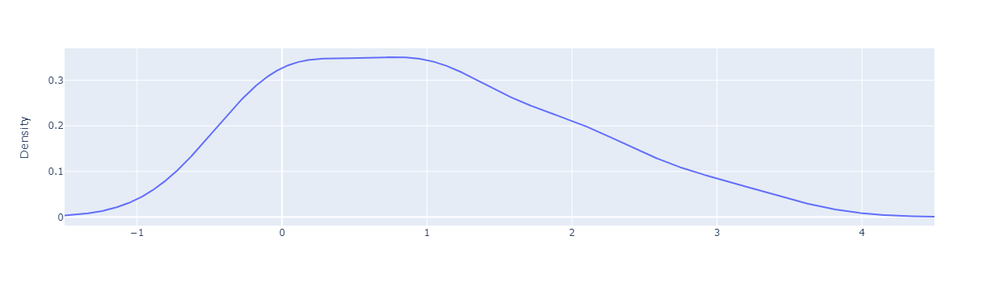

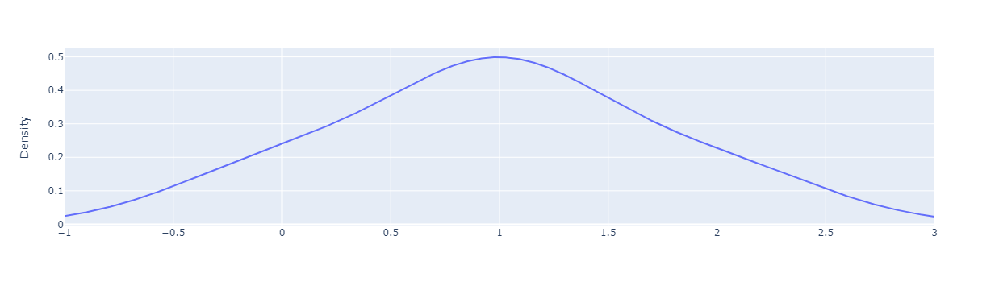

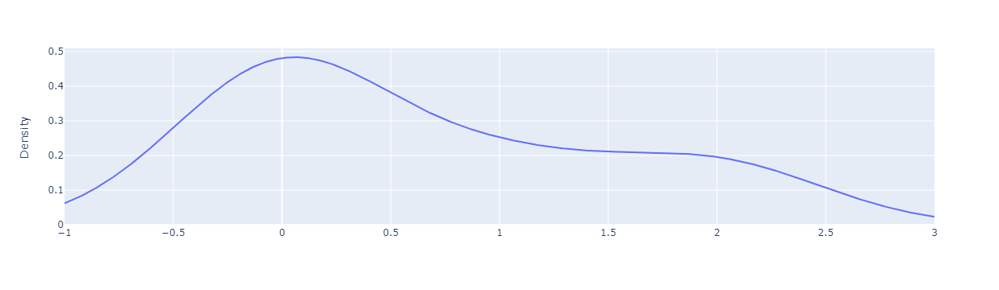

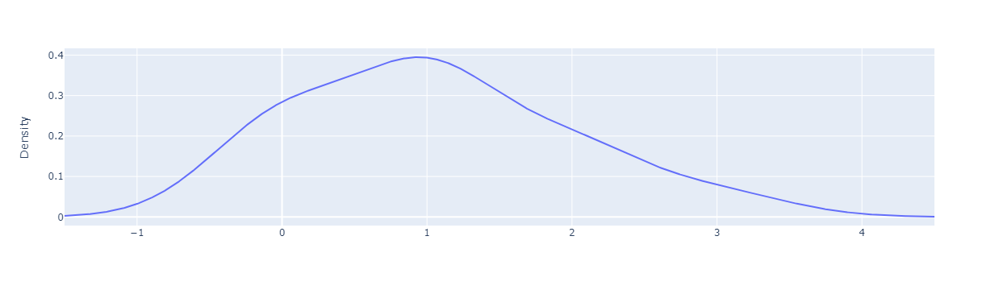

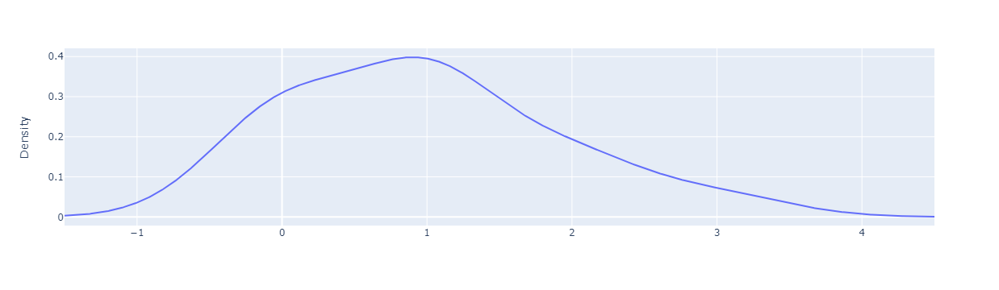

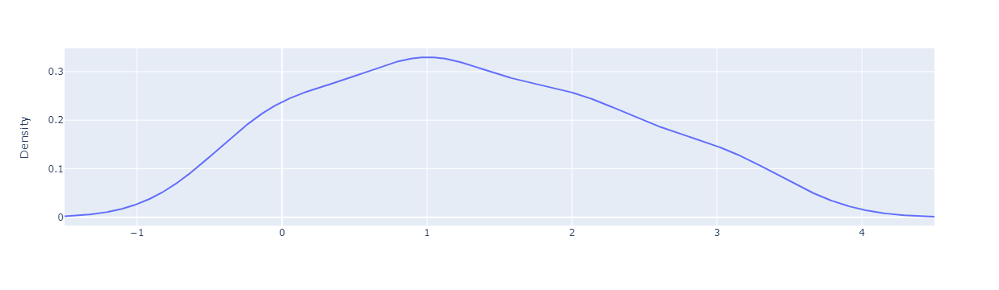

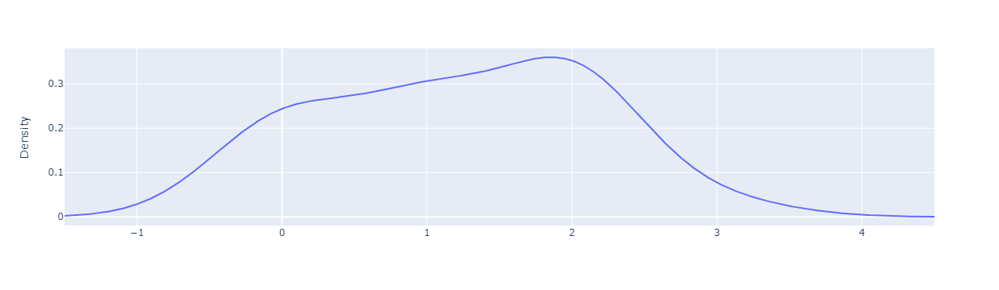

FAF                                             
                     count      mean       std  min  25%  50%  75%  max
NObesity                                                               
Obesity_Type_III     263.0  0.642586  0.815880  0.0  0.0  0.0  1.0  2.0
Overweight_Level_I   221.0  1.049774  0.890486  0.0  0.0  1.0  2.0  3.0
Obesity_Type_II      240.0  0.983333  0.659445  0.0  1.0  1.0  1.0  2.0
Insufficient_Weight  207.0  1.217391  0.890122  0.0  0.0  1.0  2.0  3.0
Overweight_Level_II  239.0  0.979079  0.881403  0.0  0.0  1.0  1.0  3.0
Normal_Weight        235.0  1.302128  1.007555  0.0  0.0  1.0  2.0  3.0
Obesity_Type_I       282.0  1.000000  0.939448  0.0  0.0  1.0  2.0  3.0

In [24]:
kernel_plot ("FAF")

<font color='red'>Normal weight group has the highest mean and widest standard deviation of physical activity frequency, Obesity_Type_III group has the smallest mean; Obesity_level_II group has the narrowest standard deviation.

### Description table and kernel density plot of `TUE`

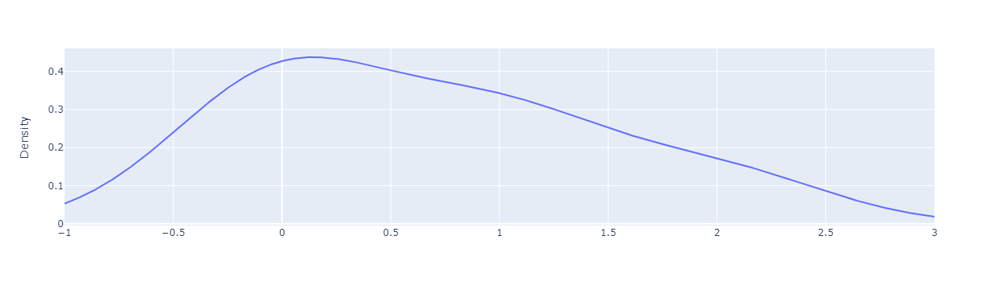

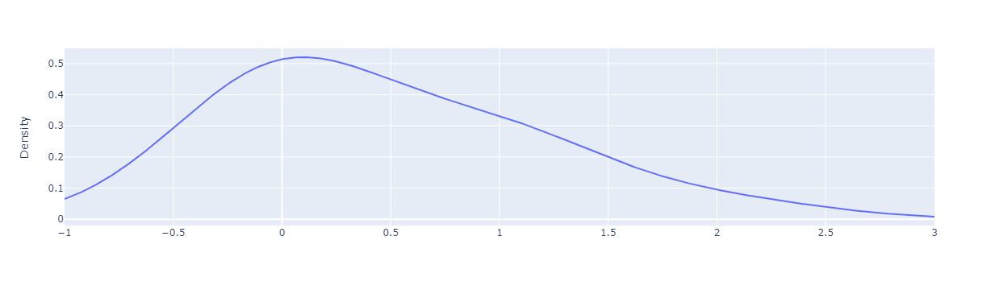

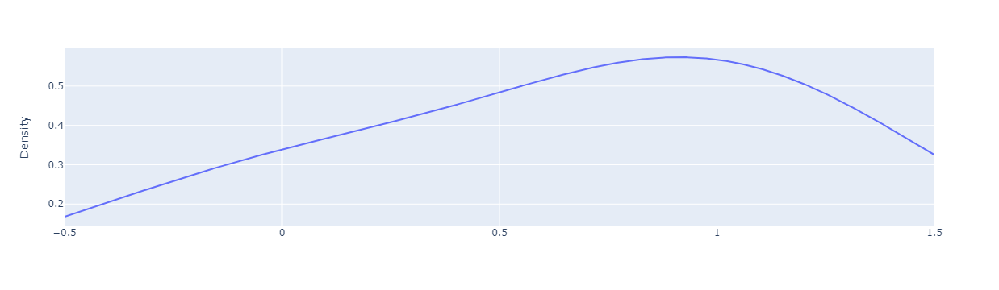

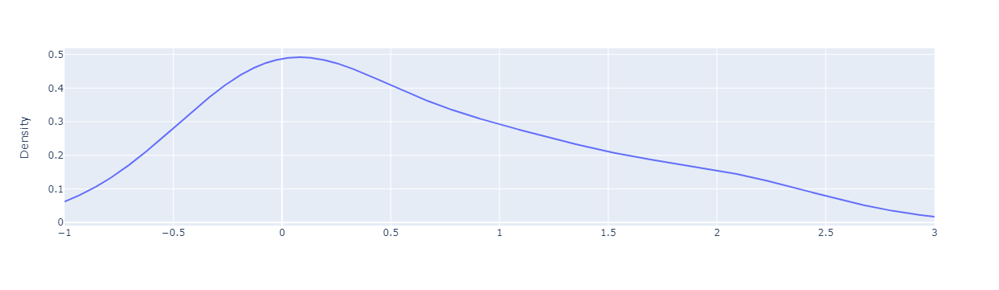

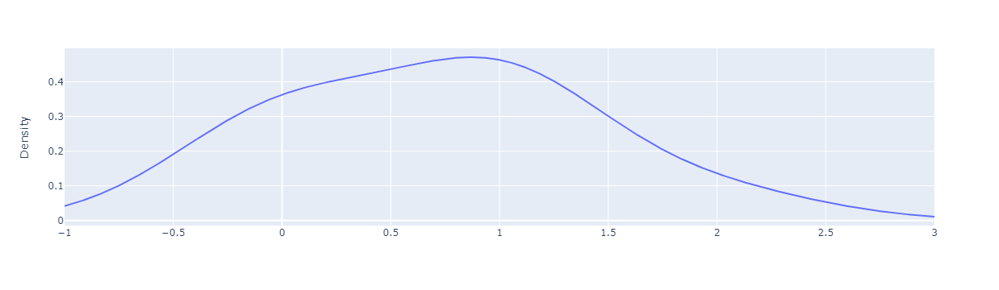

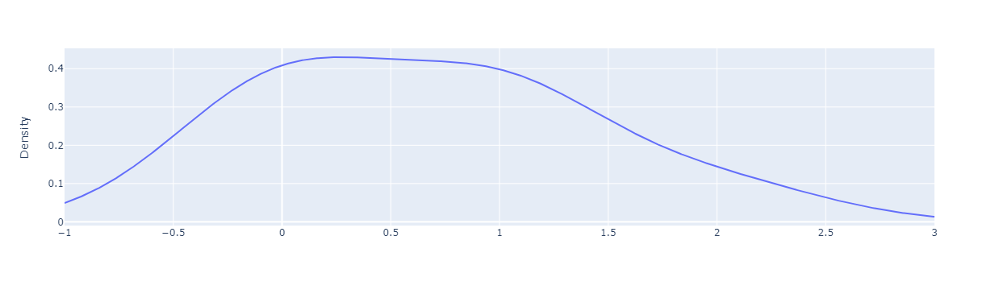

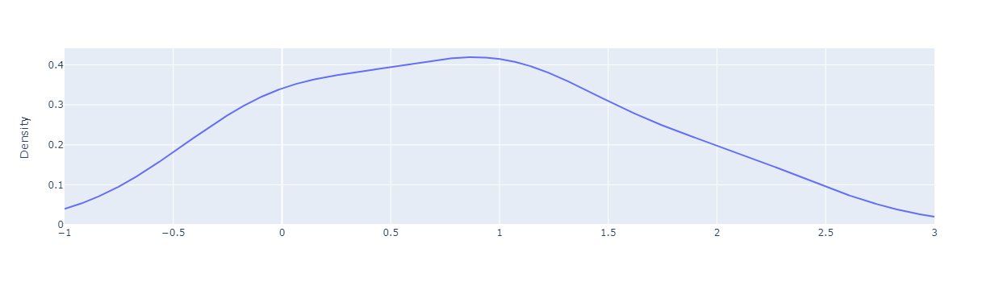

TUE                                             
                     count      mean       std  min  25%  50%  75%  max
NObesity                                                               
Obesity_Type_III     263.0  0.665399  0.472750  0.0  0.0  1.0  1.0  1.0
Overweight_Level_I   221.0  0.583710  0.749853  0.0  0.0  0.0  1.0  2.0
Obesity_Type_II      240.0  0.475000  0.633282  0.0  0.0  0.0  1.0  2.0
Insufficient_Weight  207.0  0.821256  0.725361  0.0  0.0  1.0  1.0  2.0
Overweight_Level_II  239.0  0.715481  0.637263  0.0  0.0  1.0  1.0  2.0
Normal_Weight        235.0  0.668085  0.685973  0.0  0.0  1.0  1.0  2.0
Obesity_Type_I       282.0  0.680851  0.748133  0.0  0.0  1.0  1.0  2.0

In [25]:
kernel_plot ("TUE")

<font color='red'>Insufficient_weight group has the largest mean of high technology device using time while Obesity_Type_II group has the smallest mean; overweight_level_I group has the widest standard deviation and Obesity_level_III group has the narrowest standard deviation.

### For FCVC and NCP, one Obesity category has the same value for all subjects, thus we can not do kernel density plot, we will only do description table instead.

In [26]:
sub_2= obesitydata.loc[:,["FCVC","NCP","NObesity"]]
sv_des2 = sub_2.groupby("NObesity").describe()
sv_des2

FCVC                                                 NCP                                             
                     count      mean       std  min  25%  50%  75%  max  count      mean       std  min  25%  50%  75%  max
NObesity                                                                                                                   
Obesity_Type_III     263.0  3.000000  0.000000  3.0  3.0  3.0  3.0  3.0  263.0  3.000000  0.000000  3.0  3.0  3.0  3.0  3.0
Overweight_Level_I   221.0  2.262443  0.525609  1.0  2.0  2.0  3.0  3.0  221.0  2.452489  1.006233  1.0  1.0  3.0  3.0  4.0
Obesity_Type_II      240.0  2.375000  0.621276  1.0  2.0  2.0  3.0  3.0  240.0  2.770833  0.621766  1.0  3.0  3.0  3.0  4.0
Insufficient_Weight  207.0  2.545894  0.628274  1.0  2.0  3.0  3.0  3.0  207.0  2.908213  0.932832  1.0  3.0  3.0  4.0  4.0
Overweight_Level_II  239.0  2.280335  0.511291  1.0  2.0  2.0  3.0  3.0  239.0  2.506276  0.793197  1.0  2.0  3.0  3.0  4.0
Normal_Weight        235.0  2.319149  0.581274  1.0  2.0  2.0  3.0  3.0  235.0  2.731915  0.901354  1.0  3.0  3.0  3.0  4.0
Obesity_Type_I       282.0  2.191489  0.504991  1.0  2.0  2.0  2.0  3.0  282.0  2.450355  0.826184  1.0  2.0  3.0  3.0  3.0

<font color='red'>Obesity_Type_III group has the largest mean and 0 standard deviation for vegetable consumption and main meal frequency; Obesity_Type_I group has the smallest mean of vegetable consumption and Insufficient_weight has the widest standard deviation. Obesity_level_I group has the lowest mean of main meal frequency and Obesity_level_II group has the narrowest standard deviation.

## Correlation Analysis for all the numerical predictors

In [27]:
### Correlation Matrix
indep = obesitydata[["Age","Height","Weight","FCVC","NCP","CH2O","FAF","TUE"]]
indep.corr(method='pearson')

D:\Python\Python310\lib\site-packages\pyspark\sql\context.py:125: FutureWarning:

Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.



,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
Age,1.000000,-0.010308,0.193997,0.004209,-0.033733,-0.026532,-0.133409,-0.279994
Height,-0.010308,1.000000,0.478241,-0.065864,0.243900,0.191648,0.298308,0.057219
Weight,0.193997,0.478241,1.000000,0.172750,0.121563,0.191209,-0.042681,-0.036470
FCVC,0.004209,-0.065864,0.172750,1.000000,0.013461,0.072814,0.014576,-0.046870
NCP,-0.033733,0.243900,0.121563,0.013461,1.000000,0.057044,0.127579,0.007357
CH2O,-0.026532,0.191648,0.191209,0.072814,0.057044,1.000000,0.127741,-0.039267
FAF,-0.133409,0.298308,-0.042681,0.014576,0.127579,0.127741,1.000000,0.067049
TUE,-0.279994,0.057219,-0.036470,-0.046870,0.007357,-0.039267,0.067049,1.000000


<font color='red'>`Height` and `Weight` have the strongest correlation among all the numerical predictors, we generate scatter plots for the ones with correlation coefficient greater than 0.2

## Scatter Plots for numerical predicts with correlation coefficient greater than 0.2
### Set the plotting back end as `matplotlib` and define and function

In [28]:
ps.options.plotting.backend = 'matplotlib'

def scatter_plot (varx, vary):
    '''Generate a scatter plot for selected x and y variable'''
    indep.plot.scatter(x=varx, y=vary) 
    plt.title("The Scatter plot of " + varx + " vs " + vary)
    plt.xlabel(varx)
    plt.ylabel(vary)
    plt.show()

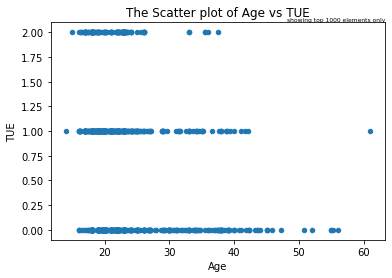

In [29]:
scatter_plot("Age", "TUE")

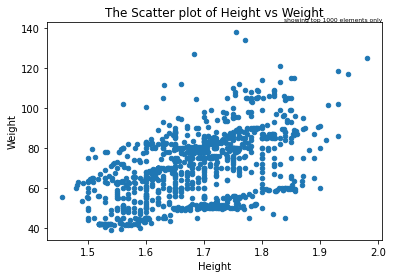

In [30]:
scatter_plot("Height", "Weight")

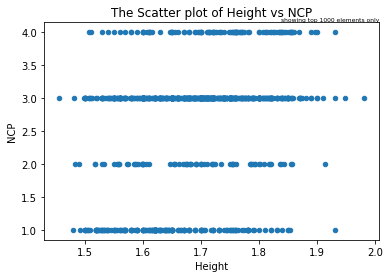

In [31]:
scatter_plot("Height", "NCP")

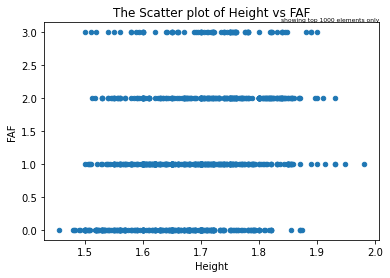

In [32]:
scatter_plot("Height", "FAF")

# <b>Models</b>

## Get dummies for categorical predictors in Training dataset

In [33]:
### Convert training SQL to pandas
obdtr = train.toPandas()

In [34]:
gender = pd.get_dummies(obdtr.Gender, prefix="Gender")
family = pd.get_dummies(obdtr.family_history_with_overweight, prefix="family_history_with_overweight")
favc = pd.get_dummies(obdtr.FAVC, prefix="FAVC")
caec = pd.get_dummies(obdtr.CAEC, prefix="CAEC")
smoke = pd.get_dummies(obdtr.SMOKE, prefix="SMOKE")
scc = pd.get_dummies(obdtr.SCC, prefix="SCC")
calc = pd.get_dummies(obdtr.CALC, prefix="CALC")
mtrans = pd.get_dummies(obdtr.MTRANS, prefix="MTRANS")
df = obdtr.drop(["Gender", "family_history_with_overweight","FAVC", "CAEC", "SMOKE", "SCC","CALC", "MTRANS"], axis = 1)
df = df.join(gender).join(family).join(favc).join(caec).join(smoke).join(scc).join(calc).join(mtrans)

## Create a function and convert the responses variable `NObesity` to a binary variable

In [35]:
def obs(x):
    if x=='Insufficient_Weight': return 0
    if x=='Normal_Weight':   return 0
    if x=='Overweight_Level_I': return 0
    if x=='Overweight_Level_II':   return 0
    if x=='Obesity_Type_I': return 1
    if x=='Obesity_Type_II':   return 1
    if x=='Obesity_Type_III': return 1
    
obsYes = df['NObesity'].apply(obs)
df = df.drop(["NObesity"], axis = 1)
df = df.join(obsYes)
df.columns

Index(['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE',
       'Gender_Female', 'Gender_Male', 'family_history_with_overweight_no',
       'family_history_with_overweight_yes', 'FAVC_no', 'FAVC_yes',
       'CAEC_Always', 'CAEC_Frequently', 'CAEC_Sometimes', 'CAEC_no',
       'SMOKE_no', 'SMOKE_yes', 'SCC_no', 'SCC_yes', 'CALC_Frequently',
       'CALC_Sometimes', 'CALC_no', 'MTRANS_Automobile', 'MTRANS_Bike',
       'MTRANS_Motorbike', 'MTRANS_Public_Transportation', 'MTRANS_Walking',
       'NObesity'],
      dtype='object')

In [36]:
df.head()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,Gender_Female,Gender_Male,...,SCC_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking,NObesity
0,15.0,1.65,86.0,3,3,1,3,2,1,0,...,0,0,0,1,0,0,0,0,1,1
1,17.0,1.63,65.0,2,1,3,1,1,1,0,...,0,0,0,1,0,0,0,1,0,0
2,17.0,1.65,67.0,3,1,2,1,1,1,0,...,0,0,0,1,0,0,0,0,1,0
3,17.0,1.70,85.0,2,3,2,1,1,1,0,...,0,0,0,1,0,0,0,1,0,0
4,18.0,1.56,51.0,2,4,2,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0


## Convert Training dataset from pandas data frame back to SQL

In [37]:
trainR = spark.createDataFrame(df)
trainR.show(5)

+----+------+------+----+---+----+---+---+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---------------+--------------+-------+-----------------+-----------+----------------+----------------------------+--------------+--------+
| Age|Height|Weight|FCVC|NCP|CH2O|FAF|TUE|Gender_Female|Gender_Male|family_history_with_overweight_no|family_history_with_overweight_yes|FAVC_no|FAVC_yes|CAEC_Always|CAEC_Frequently|CAEC_Sometimes|CAEC_no|SMOKE_no|SMOKE_yes|SCC_no|SCC_yes|CALC_Frequently|CALC_Sometimes|CALC_no|MTRANS_Automobile|MTRANS_Bike|MTRANS_Motorbike|MTRANS_Public_Transportation|MTRANS_Walking|NObesity|
+----+------+------+----+---+----+---+---+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---

# <b>Fit a FULL Logistic model with all the predictors</b>
### Exclude `Height` and `Weight`, since obesity level is defined based on `IBM` which is calculated using height and weight
## Transform SQL dataset and rename `NObesity` as `label` using `SQLTransformer` function

In [38]:
sqlTrans = SQLTransformer(
    statement = "SELECT Age, FCVC, NCP, CH2O, FAF, TUE, Gender_Female, Gender_Male, family_history_with_overweight_no,\
       family_history_with_overweight_yes, FAVC_no, FAVC_yes, CAEC_Always, CAEC_Frequently, CAEC_Sometimes, CAEC_no, SMOKE_no, SMOKE_yes, \
       SCC_no, SCC_yes, CALC_Frequently, CALC_Sometimes, CALC_no, MTRANS_Automobile, MTRANS_Bike, MTRANS_Motorbike, MTRANS_Public_Transportation,\
       MTRANS_Walking, NObesity as label FROM __THIS__"
)

In [39]:
sqlTrans.transform(trainR).show(5)

+----+----+---+----+---+---+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---------------+--------------+-------+-----------------+-----------+----------------+----------------------------+--------------+-----+
| Age|FCVC|NCP|CH2O|FAF|TUE|Gender_Female|Gender_Male|family_history_with_overweight_no|family_history_with_overweight_yes|FAVC_no|FAVC_yes|CAEC_Always|CAEC_Frequently|CAEC_Sometimes|CAEC_no|SMOKE_no|SMOKE_yes|SCC_no|SCC_yes|CALC_Frequently|CALC_Sometimes|CALC_no|MTRANS_Automobile|MTRANS_Bike|MTRANS_Motorbike|MTRANS_Public_Transportation|MTRANS_Walking|label|
+----+----+---+----+---+---+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---------------+--------------+-------+------------

## Place all predictors into `Features` using `VectorAssembler` function

In [40]:
assembler = VectorAssembler(inputCols = ["Age", "FCVC", "NCP", "CH2O", "FAF", "TUE", "Gender_Female", "Gender_Male",
                                         "family_history_with_overweight_no", "family_history_with_overweight_yes", "FAVC_no", 
                                         "FAVC_yes", "CAEC_Always", "CAEC_Frequently", "CAEC_Sometimes", "CAEC_no", "SMOKE_no", 
                                         "SMOKE_yes", "SCC_no", "SCC_yes", "CALC_Frequently", "CALC_Sometimes", "CALC_no", "MTRANS_Automobile", 
                                         "MTRANS_Bike", "MTRANS_Motorbike", "MTRANS_Public_Transportation", "MTRANS_Walking"], 
outputCol = "features", handleInvalid = 'keep')

In [41]:
assembler.transform(
    sqlTrans.transform(trainR)
).select("label", "features").show(5)

+-----+--------------------+
|label|            features|
+-----+--------------------+
|    1|(28,[0,1,2,3,4,5,...|
|    0|(28,[0,1,2,3,4,5,...|
|    0|(28,[0,1,2,3,4,5,...|
|    0|(28,[0,1,2,3,4,5,...|
|    0|(28,[0,1,2,3,4,6,...|
+-----+--------------------+
only showing top 5 rows



## Define our Logistic Regression

In [42]:
lr = LogisticRegression(maxIter=10, regParam=0.3, elasticNetParam=0.8)

## Put all the transformation steps and logistic regression into Pipeline

In [43]:
pipeline = Pipeline(stages = [sqlTrans, assembler, lr])

## Use `ParamGridBuilder` and `addGrid` functions to specify the tuning parameter values and build the grid

In [44]:
paramGrid = ParamGridBuilder() \
    .addGrid(lr.regParam, [0]) \
    .addGrid(lr.fitIntercept, [False, True]) \
    .addGrid(lr.elasticNetParam, [0]) \
    .build()

## Apply the `CrossValidator` function to run 5 folds CV with the tuning parameter values and grid we set up in previous step

In [45]:
crossval = CrossValidator(estimator = pipeline,
                          estimatorParamMaps = paramGrid,
                          evaluator = MulticlassClassificationEvaluator(metricName="accuracy"),
                          numFolds=5)

## The best model is returned after running the CV step on the Training dataset

In [46]:
cvModel = crossval.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `paramGrid` object.

In [47]:
list(zip(cvModel.avgMetrics, paramGrid))

[(0.7689267516211014,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): False,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0}),
 (0.7723689646924204,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): True,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0})]

# <b>Fit a Logistic model with all the numerical predictors</b>
## Transform SQL dataset and rename `NObesity` as label using `SQLTransformer` function

In [48]:
sqlTransN = SQLTransformer(
    statement = "SELECT Age, FCVC, NCP, CH2O, FAF, TUE, NObesity as label FROM __THIS__"
)

In [49]:
sqlTransN.transform(trainR).show(5)

+----+----+---+----+---+---+-----+
| Age|FCVC|NCP|CH2O|FAF|TUE|label|
+----+----+---+----+---+---+-----+
|15.0|   3|  3|   1|  3|  2|    1|
|17.0|   2|  1|   3|  1|  1|    0|
|17.0|   3|  1|   2|  1|  1|    0|
|17.0|   2|  3|   2|  1|  1|    0|
|18.0|   2|  4|   2|  1|  0|    0|
+----+----+---+----+---+---+-----+
only showing top 5 rows



## Place predictors into `features` using `VectorAssembler` function

In [50]:
assemblerN = VectorAssembler(inputCols = ["Age", "FCVC", "NCP", "CH2O", "FAF", "TUE"], outputCol = "features", handleInvalid = 'keep')

In [51]:
assemblerN.transform(
    sqlTransN.transform(trainR)
).select("label", "features").show(5)

+-----+--------------------+
|label|            features|
+-----+--------------------+
|    1|[15.0,3.0,3.0,1.0...|
|    0|[17.0,2.0,1.0,3.0...|
|    0|[17.0,3.0,1.0,2.0...|
|    0|[17.0,2.0,3.0,2.0...|
|    0|[18.0,2.0,4.0,2.0...|
+-----+--------------------+
only showing top 5 rows



## Put all the transformation steps and logistic regression into Pipeline

In [52]:
pipelineN = Pipeline(stages = [sqlTransN, assemblerN, lr])

## Apply the `CrossValidator` function to run 5 folds CV with the tuning parameter values and grid we set up in previous model.

In [53]:
crossvalN = CrossValidator(estimator = pipelineN,
                          estimatorParamMaps = paramGrid,
                          evaluator = MulticlassClassificationEvaluator(metricName="accuracy"),
                          numFolds=5)

## The best model is returned after running the CV step on the training dataset

In [54]:
cvModelN = crossvalN.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `paramGrid` object

In [55]:
list(zip(cvModelN.avgMetrics, paramGrid))

[(0.5653649354224015,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): False,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0}),
 (0.6329532841652146,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): True,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0})]

# <b>Fit a Logistic model with all the Categorical predictors<b/>
## Transform SQL dataset and rename `NObesity` as `label` using `SQLTransformer` function

In [56]:
sqlTransC = SQLTransformer(
    statement = "SELECT Gender_Female, Gender_Male, family_history_with_overweight_no,\
       family_history_with_overweight_yes, FAVC_no, FAVC_yes, CAEC_Always, CAEC_Frequently, CAEC_Sometimes, CAEC_no, SMOKE_no, SMOKE_yes, \
       SCC_no, SCC_yes, CALC_Frequently, CALC_Sometimes, CALC_no, MTRANS_Automobile, MTRANS_Bike, MTRANS_Motorbike, MTRANS_Public_Transportation,\
       MTRANS_Walking, NObesity as label FROM __THIS__"
)

In [57]:
sqlTransC.transform(trainR).show(5)

+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---------------+--------------+-------+-----------------+-----------+----------------+----------------------------+--------------+-----+
|Gender_Female|Gender_Male|family_history_with_overweight_no|family_history_with_overweight_yes|FAVC_no|FAVC_yes|CAEC_Always|CAEC_Frequently|CAEC_Sometimes|CAEC_no|SMOKE_no|SMOKE_yes|SCC_no|SCC_yes|CALC_Frequently|CALC_Sometimes|CALC_no|MTRANS_Automobile|MTRANS_Bike|MTRANS_Motorbike|MTRANS_Public_Transportation|MTRANS_Walking|label|
+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---------------+--------------+-------+-----------------+-----------+----------------+----------------------------+--------------+--

## Place predictors into `features` using `VectorAssembler` function

In [58]:
assemblerC = VectorAssembler(inputCols = ["Gender_Female", "Gender_Male", "family_history_with_overweight_no", 
                                          "family_history_with_overweight_yes", "FAVC_no", "FAVC_yes", "CAEC_Always", 
                                          "CAEC_Frequently", "CAEC_Sometimes", "CAEC_no", "SMOKE_no", "SMOKE_yes", "SCC_no",
                                          "SCC_yes", "CALC_Frequently", "CALC_Sometimes", "CALC_no", "MTRANS_Automobile", 
                                          "MTRANS_Bike", "MTRANS_Motorbike", "MTRANS_Public_Transportation", "MTRANS_Walking"],
                             outputCol = "features", handleInvalid = 'keep')

In [59]:
assemblerC.transform(
    sqlTransC.transform(trainR)
).select("label", "features").show(5)

+-----+--------------------+
|label|            features|
+-----+--------------------+
|    1|(22,[0,3,5,8,10,1...|
|    0|(22,[0,2,5,8,10,1...|
|    0|(22,[0,3,5,8,10,1...|
|    0|(22,[0,3,4,7,10,1...|
|    0|(22,[0,3,5,7,10,1...|
+-----+--------------------+
only showing top 5 rows



## Put all the transformation steps and logistic regression into Pipeline

In [60]:
pipelineC = Pipeline(stages = [sqlTransC, assemblerC, lr])

## Apply the `CrossValidator` function to run 5 folds CV with the tuning parameter values and grid we set up in previous model.

In [61]:
crossvalC = CrossValidator(estimator = pipelineC,
                          estimatorParamMaps = paramGrid,
                          evaluator = MulticlassClassificationEvaluator(metricName="accuracy"),
                          numFolds=5)

## The best model is returned after running the CV step on the training dataset

In [62]:
cvModelC = crossvalC.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `paramGrid` object

In [63]:
list(zip(cvModelC.avgMetrics, paramGrid))

[(0.781304748023267,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): False,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0}),
 (0.781259163977683,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): True,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0})]

# <b>Fit a Logistic model with interactions of all the numerical predictors</b>
Interaction is a Transformer which takes vector or double-valued columns, and generates a single vector column that contains the product of all combinations of one value from each input column.
## We use the `SQLTransform` step that was set up in the numerical logistic regression to only include numerical predictors and put response variable into `label` column
### Use `Interaction` function to get interactions of all the numerical predictors

In [64]:
interaction = Interaction(inputCols = ["Age", "FCVC", "NCP", "CH2O", "FAF", "TUE"], outputCol = "features")

## Put all the transformation steps and logistic regression into Pipeline

In [65]:
pipelineI = Pipeline(stages = [sqlTransN, interaction, lr])

## Apply the `CrossValidator` function to run 5 folds CV with the tuning parameter values and grid we set up in previous model.

In [66]:
crossvalI = CrossValidator(estimator = pipelineI,
                          estimatorParamMaps = paramGrid,
                          evaluator = MulticlassClassificationEvaluator(metricName="accuracy"),
                          numFolds=5)

## The best model is returned after running the CV step on the training dataset

In [67]:
cvModelI = crossvalI.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `paramGrid` object

In [68]:
list(zip(cvModelI.avgMetrics, paramGrid))

[(0.5349141606918814,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): False,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0}),
 (0.5337168564855137,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): True,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0})]

# <b>Fit a PCA model with all the numerical predictors</b>
PCA is a statistical procedure that uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components.
## We use the `SQLTransform` step that was set up in the numerical logistic regression to only include numerical predictors and put response variable into `label` column
### Use `VectorAssembler` to place numerical predictor as `vectors` column

In [69]:
assemblerP = VectorAssembler(inputCols = ["Age", "FCVC", "NCP", "CH2O", "FAF", "TUE"], outputCol = "vectors", handleInvalid = 'keep')

## Use `StandardScaler` function to standardize the `vectors` and output them into `scaleFeatures` 

In [70]:
scaler = StandardScaler(
    inputCol = 'vectors', 
    outputCol = 'scaledFeatures',
    withMean = True,
    withStd = True
)

## Define our PCA model

In [71]:
pca = PCA(
    k = 3, 
    inputCol = 'scaledFeatures', 
    outputCol = 'features'
)

## Put all the transformation steps and logistic regression into Pipeline

In [72]:
pipelineP = Pipeline(stages = [sqlTransN, assemblerP, scaler, pca, lr])

## Apply the `CrossValidator` function to run 5 folds CV with the tuning parameter values and grid we set up in previous model.

In [73]:
crossvalP = CrossValidator(estimator = pipelineP,
                          estimatorParamMaps = paramGrid,
                          evaluator = MulticlassClassificationEvaluator(metricName="accuracy"),
                          numFolds=5)

## The best model is returned after running the CV step on the training dataset

In [74]:
cvModelP = crossvalP.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `paramGrid` object

In [75]:
list(zip(cvModelP.avgMetrics, paramGrid))

[(0.5753834173796891,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): False,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0}),
 (0.575804211168356,
  {Param(parent='LogisticRegression_dad0d9942795', name='regParam', doc='regularization parameter (>= 0).'): 0.0,
   Param(parent='LogisticRegression_dad0d9942795', name='fitIntercept', doc='whether to fit an intercept term.'): True,
   Param(parent='LogisticRegression_dad0d9942795', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0})]

# <b>Fit a Classification Tree model with all the predictors</b>
## Add metadata to index the label column

In [76]:
labelIndexer = StringIndexer(inputCol="label", outputCol="indexedLabel")

## Automatically identify categorical features, and index them.
We specify maxCategories so features with > 2 distinct values are treated as continuous.

In [77]:
featureIndexer = VectorIndexer(inputCol="features", 
                               outputCol="indexedFeatures", maxCategories=2)

## Set up the DecisionTree model

In [78]:
dt = DecisionTreeClassifier(labelCol="indexedLabel", featuresCol="indexedFeatures")

## Put all the transformation steps and classification tree model setting into Pipeline
### we use the transformation and vector assembling steps as we define in the full logistic model to put `NObesity` as `label` and all the predictors into `features`

In [79]:
pipelineT = Pipeline(stages = [sqlTrans, assembler, labelIndexer, featureIndexer, dt])

## Create `ParamGrid` for Cross Validation

In [80]:
dtparamGrid = (ParamGridBuilder()
             .addGrid(dt.maxDepth, [2, 5, 10, 20, 30])
             .addGrid(dt.maxBins, [10, 20, 40, 80, 100])
             .build())

## Apply the 'CrossValidator' function to run 5 folds CV with the grid we set up in previous step.

In [81]:
crossvalT = CrossValidator(estimator = pipelineT,
                          estimatorParamMaps = dtparamGrid,
                          evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy"),
                          numFolds=5)

## Fit the classification tree model on the training dataset and return the best model

In [82]:
cvModelT = crossvalT.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `dtparamGrid` object.

In [83]:
list(zip(cvModelT.avgMetrics, dtparamGrid))

[(0.7117234379256621,
  {Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 2,
   Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxBins', doc='Max number of bins for discretizing continuous features.  Must be >=2 and >= number of categories for any categorical feature.'): 10}),
 (0.7117234379256621,
  {Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 2,
   Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxBins', doc='Max number of bins for discretizing continuous features.  Must be >=2 and >= number of categories for any categorical feature.'): 20}),
 (0.7117234379256621,
  {Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxDe

# <b>Fit a random forest model with all the predictors</b>
### we use the transformation and vector assembling steps as we defined in the full logistic model to put `NObesity` as `label` and all the predictors into `features`, we also use the indexing steps as we set up for the classification tree model.
## Set up the Random Forest model

In [84]:
rf = RandomForestClassifier(labelCol="indexedLabel", featuresCol="indexedFeatures", numTrees=10)

## Put all the transformation steps and Random forest model into Pipeline

In [85]:
pipelineR = Pipeline(stages = [sqlTrans, assembler, labelIndexer, featureIndexer, rf])

## Create `ParamGrid` for Cross Validation

In [86]:
rfparamGrid = (ParamGridBuilder()
             .addGrid(rf.maxDepth, [2, 5, 10, 20, 30])
             .addGrid(rf.maxBins, [10, 20, 40, 80, 100])
             .build())

## Apply the `CrossValidator` function to run 5 folds CV with the grid we set up in previous step.

In [87]:
crossvalR = CrossValidator(estimator = pipelineR,
                          estimatorParamMaps = rfparamGrid,
                          evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy"),
                          numFolds=5)

## Fit the Random Forest model on the training dataset and return the best model

In [88]:
cvModelR = crossvalR.fit(trainR)

## Determine the model got returned by using `avgMetrics` Attribute and `dtparamGrid` object.

In [89]:
list(zip(cvModelR.avgMetrics, dtparamGrid))

[(0.7539470627387321,
  {Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 2,
   Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxBins', doc='Max number of bins for discretizing continuous features.  Must be >=2 and >= number of categories for any categorical feature.'): 10}),
 (0.7528455637648926,
  {Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 2,
   Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxBins', doc='Max number of bins for discretizing continuous features.  Must be >=2 and >= number of categories for any categorical feature.'): 20}),
 (0.7528455637648926,
  {Param(parent='DecisionTreeClassifier_2c80c59425f9', name='maxDe

# <b>Prediction

## Get dummies for categorical predictors in Test dataset

In [90]:
### Convert test SQL to pandas
obdts = test.toPandas()

In [91]:
gender = pd.get_dummies(obdts.Gender, prefix="Gender")
family = pd.get_dummies(obdts.family_history_with_overweight, prefix="family_history_with_overweight")
favc = pd.get_dummies(obdts.FAVC, prefix="FAVC")
caec = pd.get_dummies(obdts.CAEC, prefix="CAEC")
smoke = pd.get_dummies(obdts.SMOKE, prefix="SMOKE")
scc = pd.get_dummies(obdts.SCC, prefix="SCC")
calc = pd.get_dummies(obdts.CALC, prefix="CALC")
mtrans = pd.get_dummies(obdts.MTRANS, prefix="MTRANS")
dfs = obdts.drop(["Gender", "family_history_with_overweight","FAVC", "CAEC", "SMOKE", "SCC","CALC", "MTRANS"], axis = 1)
dfs = dfs.join(gender).join(family).join(favc).join(caec).join(smoke).join(scc).join(calc).join(mtrans)

## Convert the responses variable `NObesity` to a binary variable using the function we defined in model step

In [92]:
obsYes = dfs['NObesity'].apply(obs)
dfs = dfs.drop(["NObesity"], axis = 1)
dfs = dfs.join(obsYes)
dfs.columns

Index(['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE',
       'Gender_Female', 'Gender_Male', 'family_history_with_overweight_no',
       'family_history_with_overweight_yes', 'FAVC_no', 'FAVC_yes',
       'CAEC_Always', 'CAEC_Frequently', 'CAEC_Sometimes', 'CAEC_no',
       'SMOKE_no', 'SMOKE_yes', 'SCC_no', 'SCC_yes', 'CALC_Frequently',
       'CALC_Sometimes', 'CALC_no', 'MTRANS_Automobile', 'MTRANS_Bike',
       'MTRANS_Motorbike', 'MTRANS_Public_Transportation', 'MTRANS_Walking',
       'NObesity'],
      dtype='object')

In [93]:
dfs.head()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,Gender_Female,Gender_Male,...,SCC_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking,NObesity
0,17.0,1.75,57.0,3,3,2,0,1,1,0,...,0,0,0,1,0,0,0,1,0,0
1,19.0,1.63,58.0,3,3,2,0,0,1,0,...,1,0,0,1,0,0,0,1,0,0
2,19.0,1.63,76.0,3,3,3,2,1,1,0,...,0,0,1,0,1,0,0,0,0,0
3,19.0,1.64,53.0,3,3,1,1,1,1,0,...,0,0,0,1,0,0,0,1,0,0
4,19.0,1.65,61.0,3,1,3,1,0,1,0,...,1,0,1,0,0,0,0,1,0,0


## Convert Test dataset from pandas data frame back to SQL

In [94]:
testSQL = spark.createDataFrame(dfs)
testSQL.show(5)

+----+------+------+----+---+----+---+---+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---------------+--------------+-------+-----------------+-----------+----------------+----------------------------+--------------+--------+
| Age|Height|Weight|FCVC|NCP|CH2O|FAF|TUE|Gender_Female|Gender_Male|family_history_with_overweight_no|family_history_with_overweight_yes|FAVC_no|FAVC_yes|CAEC_Always|CAEC_Frequently|CAEC_Sometimes|CAEC_no|SMOKE_no|SMOKE_yes|SCC_no|SCC_yes|CALC_Frequently|CALC_Sometimes|CALC_no|MTRANS_Automobile|MTRANS_Bike|MTRANS_Motorbike|MTRANS_Public_Transportation|MTRANS_Walking|NObesity|
+----+------+------+----+---+----+---+---+-------------+-----------+---------------------------------+----------------------------------+-------+--------+-----------+---------------+--------------+-------+--------+---------+------+-------+---

## Calculate the accuracy of the Full logistic regression model after fitting on the test dataset

In [95]:
accuracy = MulticlassClassificationEvaluator(metricName="accuracy").evaluate(cvModel.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracy))

Test Error = 0.224057 


## Calculate the accuracy of the Numerical logistic regression model after fitting on the test dataset

In [96]:
accuracyN = MulticlassClassificationEvaluator(metricName="accuracy").evaluate(cvModelN.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracyN))

Test Error = 0.358491 


## Calculate the accuracy of the Categorical logistic regression model after fitting on the test dataset

In [97]:
accuracyC = MulticlassClassificationEvaluator(metricName="accuracy").evaluate(cvModelC.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracyC))

Test Error = 0.238208 


## Calculate the accuracy of the Interaction logistic regression model after fitting on the test dataset

In [98]:
accuracyI = MulticlassClassificationEvaluator(metricName="accuracy").evaluate(cvModelI.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracyI))

Test Error = 0.441038 


## Calculate the accuracy of the PCA logistic regression model after fitting on the test dataset

In [99]:
accuracyP = MulticlassClassificationEvaluator(metricName="accuracy").evaluate(cvModelP.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracyP))

Test Error = 0.377358 


## Calculate the accuracy of the Classification tree model after fitting on the test dataset

In [100]:
accuracyT = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy").evaluate(cvModelT.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracyT))

Test Error = 0.113208 


## Calculate the accuracy of the Random forest model after fitting on the test dataset

In [101]:
accuracyR = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy").evaluate(cvModelR.transform(testSQL))
print("Test Error = %g " % (1.0 - accuracyR))

Test Error = 0.0943396 


# <b>Conclusion

### According to the Accuracy scores(test error rates), the full logistic regression model (0.247642) have a similar predication performance as using categorical variables only (0.238208), but much better than using numerical variables only(0.358491), interaction(0.441038) and PCA(0.396226) logistic regression models. As expected, Random Forest (0.108491) showed a better prediction performance than Classification Tree (0.129717). Overall, the best model for this data set is Random Forest.